<a href="https://colab.research.google.com/github/duonghung86/GAN-Generative-Adversarial-Networks/blob/main/TF_VanillaGAN_UD1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vanilla GAN for Uniform Distribution
---

$$X -U(0,1)$$

Source: https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-1-dimensional-function-from-scratch-in-keras/


In [ ]:
# Load packages
import numpy as np
from numpy import hstack
from numpy import zeros
from numpy import ones
from numpy.random import rand
from numpy.random import randn
import seaborn as sns
import os
# Tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Visualization
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model
from IPython import display
import matplotlib.animation as animation

# Download output files
from google.colab import files

## Create Data set

Data set have 2 features:
- X1 random variable from uniform distribution N(0,1)

[[0.14111073]
 [0.62728885]
 [0.44487122]
 [0.04434345]
 [0.2633304 ]]


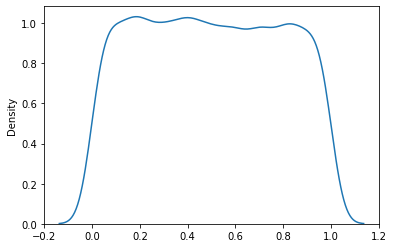

In [ ]:
POINTS = 10000
np.random.seed(32)
X = np.random.uniform(1, 0, [POINTS,1])
y = ones((POINTS, 1)) # Labels for real data
print(X[:5])
# Visualization
sns.kdeplot(X[:,0])
plt.show()

## Discriminator

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 20)                40        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 21        
Total params: 61
Trainable params: 61
Non-trainable params: 0
_________________________________________________________________


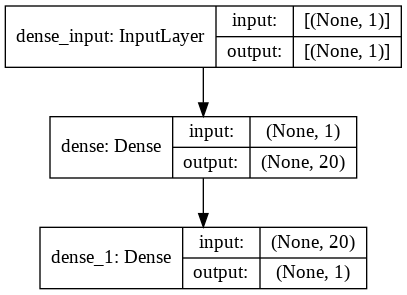

In [ ]:
# define the standalone discriminator model
def define_discriminator(n_inputs=1):
	model = Sequential()
	model.add(Dense(20, activation='relu', kernel_initializer='he_uniform', input_dim=n_inputs))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model
# define the discriminator model
model = define_discriminator()
# summarize the model
model.summary()
# plot the model
plot_model(model,show_shapes=True, show_layer_names=True)

In [ ]:
# test with real data
model.predict(X)

array([[0.5028067 ],
       [0.5124744 ],
       [0.5088478 ],
       ...,
       [0.50698775],
       [0.51132655],
       [0.5082244 ]], dtype=float32)

## Generator

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 20)                120       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 21        
Total params: 141
Trainable params: 141
Non-trainable params: 0
_________________________________________________________________


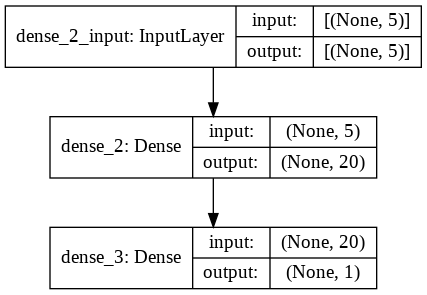

In [ ]:
# define the standalone generator model
def define_generator(latent_dim, n_outputs=1):
	model = Sequential()
	model.add(Dense(20, activation='relu', kernel_initializer='he_uniform', input_dim=latent_dim))
	model.add(Dense(n_outputs, activation='linear'))
	return model
# define the generator model
model = define_generator(5)
# summarize the model
model.summary()
# plot the model
plot_model(model, show_shapes=True, show_layer_names=True)

(100, 1)


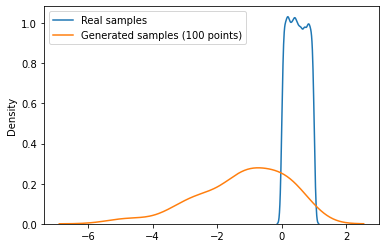

In [ ]:
def generate_samples(generator, latent_dim, n):
    # prepare random noise
    z = np.random.normal(0, 1, [n,latent_dim])
    # prepare fake examples
    gen_X = generator.predict(z)
    gen_y = zeros((n, 1))
    return gen_X, gen_y
gen_X, gen_y = generate_samples(generator=model, latent_dim = 5, n = 100)

print(gen_X.shape)
# Visualization
# Visualization
sns.kdeplot(X[:,0],label = 'Real samples')
sns.kdeplot(gen_X[:,0],label = 'Generated samples (100 points)')
plt.legend()
plt.show()

## GAN model  = Discriminator + Generator

The weights in the discriminator are marked as not trainable, which only affects the weights as seen by the GAN model and not the standalone discriminator model.

`What will happen if we don't set that?`

In [ ]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(generator, discriminator):
	# make weights in the discriminator not trainable
	discriminator.trainable = False
	# connect them
	model = Sequential()
	# add generator
	model.add(generator)
	# add the discriminator
	model.add(discriminator)
	# compile model
	model.compile(loss='binary_crossentropy', optimizer='adam')
	return model

## Visualization for each epoch

In [ ]:
# evaluate the discriminator and plot real and fake points
def summarize_performance(epoch, generator, discriminator, latent_dim, n=100):
    # prepare real samples
    #x_real, y_real = generate_real_samples(n)
    # evaluate discriminator on real examples
    _, acc_real = discriminator.evaluate(X, y, verbose=0)
    # prepare fake examples
    gen_X, gen_y = generate_samples(generator, latent_dim, n)
    # evaluate discriminator on fake examples
    _, acc_fake = discriminator.evaluate(gen_X, gen_y, verbose=0)
    # summarize discriminator performance
    print(epoch, acc_real, acc_fake)

    # scatter plot real and fake data points
    sns.kdeplot(X[:,0],label = 'Real samples')
    sns.kdeplot(gen_X[:,0],label = 'Generated samples ({0:04d} points)'.format(n))
    plt.legend()
    plt.title('Epoch #{0:04d}'.format(epoch))
    plt.xlim(-1,2)
    plt.ylim(-1,2)
    plt.savefig('./Figs/Epoch #{0:04d}.png'.format(epoch))
    plt.show()
    return acc_real, acc_fake

## Training function

In [ ]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, latent_dim, n_epochs=10000, n_batch=128, n_eval=20):
    # determine half the size of one batch, for updating the discriminator
    half_batch = n_batch // 2
    # manually enumerate epochs
    accs= [] 
    for i in range(n_epochs):
		# prepare real samples
        batch_indices = np.random.randint(POINTS-1,size=half_batch)
        batch_X = X[batch_indices,:]
        batch_y = y[batch_indices]

        # prepare fake examples
        gen_X, gen_y = generate_samples(generator=g_model,
                                        latent_dim = latent_dim,
                                        n = half_batch)
        
        # update discriminator
        d_model.train_on_batch(batch_X, batch_y)
        d_model.train_on_batch(gen_X, gen_y)
        
        # prepare points in latent space as input for the generator
        x_gan = np.random.normal(0, 1, [n_batch,latent_dim])
        # create inverted labels for the fake samples
        y_gan = ones((n_batch, 1))
        # update the generator via the discriminator's error
        gan_model.train_on_batch(x_gan, y_gan)
        # evaluate the model every n_eval epochs
        if i % n_eval == 0:
            display.clear_output(wait=True)
            acc_real, acc_fake = summarize_performance(i, g_model, d_model, latent_dim,POINTS)
            accs.append([acc_real, acc_fake])
    return accs

In [ ]:
!rm -r Figs

In [ ]:
!mkdir Figs

9980 0.0 1.0


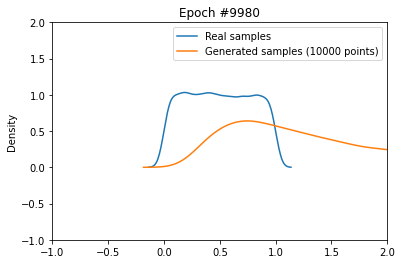

CPU times: user 18min 56s, sys: 51.8 s, total: 19min 48s
Wall time: 18min 13s


In [ ]:
%%time
# size of the latent space
latent_dim = 5
# create the discriminator
discriminator = define_discriminator()
# create the generator
generator = define_generator(latent_dim)
# create the gan
gan_model = define_gan(generator, discriminator)
# train model
accs = train(generator, discriminator, gan_model, latent_dim)

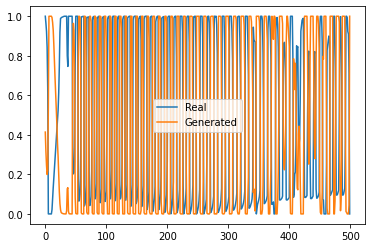

In [ ]:
accs = np.array(accs)
plt.plot(accs[:,0],label = 'Real')
plt.plot(accs[:,1],label = 'Generated')
plt.legend()
plt.savefig('Accuracy_log_ud1.png',dpi=200)
plt.show()

In [ ]:
files.download('Accuracy_log_ud1.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Create a GIF


In [ ]:
import PIL

In [ ]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('./Figs/Epoch #{:04d}.png'.format(epoch_no))

Use `imageio` to create an animated gif using the images saved during training.

In [ ]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-2_vdn86y
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-2_vdn86y
     |████████████████████████████████| 1.0MB 5.8MB/s 
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.020ae69d1950eddcd5a50c5f1402370a87974a316_-cp37-none-any.whl size=147329 sha256=8ad7f2ae8a186d86857f7893993c1934ed2a63eaf7b1c0109ee55250e0750f91
  Stored in directory: /tmp/pip-ephem-wheel-cache-algqlcd9/wheels/eb/1b/35/fce87697be00d2fc63e0b4b395b0d9c7e391a10e98d9a0d97f
Successfully built tensorflow-docs
  Found existing installation: protobuf 3.12.4
    Uninstalling protobuf-3.12.4:
      Successfully uninstalled protobuf-3.12.4


In [ ]:
import glob
import imageio

In [ ]:
anim_file = 'vgan_ud1.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('Figs/Epoch*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


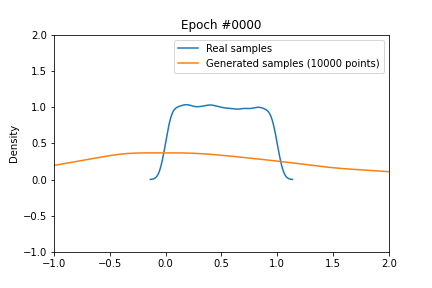

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [ ]:
files.download('vgan_ud1.gif')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# END